# Loading the data

In [2]:
import pandas as pd
import glob
import numpy as np
import altair as alt
import json
import math

'''since we have multiple datasets we use this function to load them all'''
def importAll(path):    
    all_files = glob.glob(path + "/*.csv")
    res = {}

    for filename in all_files:
        print('Importing:', filename)
        df = pd.read_csv(filename, index_col=None, header=0)
        res[filename] = df
    return res

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 40)

In [3]:
competitive = importAll('1076')
'''These are taken from the kaggle competiive LoL dataset, linked here:
https://www.kaggle.com/chuckephron/leagueoflegends?select=LeagueofLegends.csv'''

Importing: 1076/bans.csv
Importing: 1076/gold.csv
Importing: 1076/kills.csv
Importing: 1076/LeagueofLegends.csv
Importing: 1076/matchinfo.csv
Importing: 1076/monsters.csv
Importing: 1076/structures.csv
Importing: 1076/_columns.csv


'These are taken from the kaggle competiive LoL dataset, linked here:\nhttps://www.kaggle.com/chuckephron/leagueoflegends?select=LeagueofLegends.csv'

# Taking an inital look at the data

In [4]:
competitive_datasets = list(competitive.keys())
competitive_datasets
#These are the datasets we have to work with...but the gold, kills, monsters, and structures datasets are all just subsets of LeagueofLegends dataset.

['1076/bans.csv',
 '1076/gold.csv',
 '1076/kills.csv',
 '1076/LeagueofLegends.csv',
 '1076/matchinfo.csv',
 '1076/monsters.csv',
 '1076/structures.csv',
 '1076/_columns.csv']

In [5]:
matchdata = competitive['1076/LeagueofLegends.csv']
print(matchdata.columns)
# thse are our indendepent variables, which we'll use for prediction later
matchdata.describe()
#Something interesting right away....blue side wins 5% more than red side!

Index(['League', 'Year', 'Season', 'Type', 'blueTeamTag', 'bResult', 'rResult',
       'redTeamTag', 'gamelength', 'golddiff', 'goldblue', 'bKills', 'bTowers',
       'bInhibs', 'bDragons', 'bBarons', 'bHeralds', 'goldred', 'rKills',
       'rTowers', 'rInhibs', 'rDragons', 'rBarons', 'rHeralds', 'blueTop',
       'blueTopChamp', 'goldblueTop', 'blueJungle', 'blueJungleChamp',
       'goldblueJungle', 'blueMiddle', 'blueMiddleChamp', 'goldblueMiddle',
       'blueADC', 'blueADCChamp', 'goldblueADC', 'blueSupport',
       'blueSupportChamp', 'goldblueSupport', 'blueBans', 'redTop',
       'redTopChamp', 'goldredTop', 'redJungle', 'redJungleChamp',
       'goldredJungle', 'redMiddle', 'redMiddleChamp', 'goldredMiddle',
       'redADC', 'redADCChamp', 'goldredADC', 'redSupport', 'redSupportChamp',
       'goldredSupport', 'redBans', 'Address'],
      dtype='object')


,Year,bResult,rResult,gamelength
count,7620.000000,7620.000000,7620.000000,7620.000000
mean,2016.280971,0.544094,0.455906,37.012598
std,0.848200,0.498085,0.498085,7.983238
min,2014.000000,0.000000,0.000000,17.000000
25%,2016.000000,0.000000,0.000000,31.000000
50%,2016.000000,1.000000,0.000000,36.000000
75%,2017.000000,1.000000,1.000000,41.000000
max,2018.000000,1.000000,1.000000,95.000000


In [6]:
wins = competitive['1076/matchinfo.csv']
#these are our dependent variables: namely 
#League, Year, Season, and Type, and Win/Lose. We disregard all  other columns for our analysis.
wins.head()

,League,Year,Season,Type,blueTeamTag,bResult,rResult,redTeamTag,gamelength,blueTop,blueTopChamp,blueJungle,blueJungleChamp,blueMiddle,blueMiddleChamp,blueADC,blueADCChamp,blueSupport,blueSupportChamp,redTop,redTopChamp,redJungle,redJungleChamp,redMiddle,redMiddleChamp,redADC,redADCChamp,redSupport,redSupportChamp,Address
0,NALCS,2015,Spring,Season,TSM,1,0,C9,40,Dyrus,Irelia,Santorin,RekSai,Bjergsen,Ahri,WildTurtle,Jinx,Lustboy,Janna,Balls,Gnar,Meteos,Elise,Hai,Fizz,Sneaky,Sivir,LemonNation,Thresh,http://matchhistory.na.leagueoflegends.com/en/...
1,NALCS,2015,Spring,Season,CST,0,1,DIG,38,Cris,Gnar,Impaler,Rengar,Jesiz,Ahri,Mash,Caitlyn,Sheep,Leona,Gamsu,Irelia,Crumbzz,JarvanIV,Shiphtur,Azir,CoreJJ,Corki,KiWiKiD,Annie,http://matchhistory.na.leagueoflegends.com/en/...
2,NALCS,2015,Spring,Season,WFX,1,0,GV,40,Flaresz,Renekton,ShorterACE,Rengar,Pobelter,Fizz,Altec,Sivir,Gleeb,Annie,Hauntzer,Sion,Saintvicious,LeeSin,Keane,Azir,Cop,Corki,BunnyFuFuu,Janna,http://matchhistory.na.leagueoflegends.com/en/...
3,NALCS,2015,Spring,Season,TIP,0,1,TL,41,Rhux,Irelia,Rush,JarvanIV,XiaoWeiXiao,Leblanc,Apollo,Sivir,Adrian,Thresh,Quas,Gnar,IWDominate,Nunu,Fenix,Lulu,KEITH,KogMaw,Xpecial,Janna,http://matchhistory.na.leagueoflegends.com/en/...
4,NALCS,2015,Spring,Season,CLG,1,0,T8,35,Benny,Gnar,Xmithie,JarvanIV,Link,Lissandra,Doublelift,Tristana,aphromoo,Janna,CaliTrlolz8,Sion,Porpoise8,RekSai,Slooshi8,Lulu,Maplestreet8,Corki,Dodo8,Annie,http://matchhistory.na.leagueoflegends.com/en/...


In [7]:
#we select only the columns we are interested in. We select gamelength as well for use as an independent variable
wins = wins[['League', 'Year', 'Season', 'Type', 'bResult', 'rResult', 'gamelength']]
matchdata = matchdata[[ 'golddiff', 'goldblue', 'bKills', 'bTowers', 'bInhibs', 'bDragons',
       'bBarons', 'bHeralds', 'goldred', 'rKills', 'rTowers', 'rInhibs',
       'rDragons', 'rBarons', 'rHeralds', 'blueTop', 'blueTopChamp',
       'goldblueTop', 'blueJungle', 'blueJungleChamp', 'goldblueJungle',
       'blueMiddle', 'blueMiddleChamp', 'goldblueMiddle', 'blueADC',
       'blueADCChamp', 'goldblueADC', 'blueSupport', 'blueSupportChamp',
       'goldblueSupport', 'blueBans', 'redTop', 'redTopChamp', 'goldredTop',
       'redJungle', 'redJungleChamp', 'goldredJungle', 'redMiddle',
       'redMiddleChamp', 'goldredMiddle', 'redADC', 'redADCChamp',
       'goldredADC', 'redSupport', 'redSupportChamp', 'goldredSupport',
       'redBans']]

wins.shape[0] == matchdata.shape[0]
#weach row/sample in the wins dataset correponds to a row/sample in the matchdata:
# this makes it extremely easy to combine thme, 
# since we would like to combine them first for preprocessing thisataset has one to one correspondence to matchdata
league = pd.concat([wins, matchdata], axis=1)
league.columns

Index(['League', 'Year', 'Season', 'Type', 'bResult', 'rResult', 'gamelength',
       'golddiff', 'goldblue', 'bKills', 'bTowers', 'bInhibs', 'bDragons',
       'bBarons', 'bHeralds', 'goldred', 'rKills', 'rTowers', 'rInhibs',
       'rDragons', 'rBarons', 'rHeralds', 'blueTop', 'blueTopChamp',
       'goldblueTop', 'blueJungle', 'blueJungleChamp', 'goldblueJungle',
       'blueMiddle', 'blueMiddleChamp', 'goldblueMiddle', 'blueADC',
       'blueADCChamp', 'goldblueADC', 'blueSupport', 'blueSupportChamp',
       'goldblueSupport', 'blueBans', 'redTop', 'redTopChamp', 'goldredTop',
       'redJungle', 'redJungleChamp', 'goldredJungle', 'redMiddle',
       'redMiddleChamp', 'goldredMiddle', 'redADC', 'redADCChamp',
       'goldredADC', 'redSupport', 'redSupportChamp', 'goldredSupport',
       'redBans'],
      dtype='object')

# Transforming and preprocessing the data 

## (no cleaning necessary, data was preprocessed beforehand by Kaggle contributor)

In [8]:
league.head()

,League,Year,Season,Type,bResult,rResult,gamelength,golddiff,goldblue,bKills,bTowers,bInhibs,bDragons,bBarons,bHeralds,goldred,rKills,rTowers,rInhibs,rDragons,rBarons,rHeralds,blueTop,blueTopChamp,goldblueTop,blueJungle,blueJungleChamp,goldblueJungle,blueMiddle,blueMiddleChamp,goldblueMiddle,blueADC,blueADCChamp,goldblueADC,blueSupport,blueSupportChamp,goldblueSupport,blueBans,redTop,redTopChamp,goldredTop,redJungle,redJungleChamp,goldredJungle,redMiddle,redMiddleChamp,goldredMiddle,redADC,redADCChamp,goldredADC,redSupport,redSupportChamp,goldredSupport,redBans
0,NALCS,2015,Spring,Season,1,0,40,"[0, 0, -14, -65, -268, -431, -488, -789, -494,...","[2415, 2415, 2711, 3887, 5068, 6171, 7412, 866...","[[10.82, 'C9 Hai', 'TSM Bjergsen', [], 9229, 8...","[[27.542, 'MID_LANE', 'BASE_TURRET'], [39.269,...","[[36.686, 'MID_LANE'], [29.274, 'MID_LANE']]","[[37.267, None]]",[],[],"[2415, 2415, 2725, 3952, 5336, 6602, 7900, 945...","[[16.529, 'TSM Lustboy', 'C9 Balls', ['C9 Mete...","[[39.23, 'TOP_LANE', 'INNER_TURRET'], [20.681,...",[],"[[17.14, None], [30.934, None], [24.641, None]]",[[29.954]],[],Dyrus,Irelia,"[475, 475, 532, 687, 893, 1058, 1172, 1471, 18...",Santorin,RekSai,"[475, 475, 532, 870, 1049, 1276, 1596, 1815, 2...",Bjergsen,Ahri,"[475, 475, 532, 807, 1102, 1307, 1651, 1950, 2...",WildTurtle,Jinx,"[475, 475, 532, 797, 1127, 1453, 1766, 2044, 2...",Lustboy,Janna,"[515, 515, 583, 726, 897, 1077, 1227, 1381, 15...","['Rumble', 'Kassadin', 'Lissandra']",Balls,Gnar,"[475, 475, 532, 728, 958, 1284, 1526, 1912, 21...",Meteos,Elise,"[475, 475, 532, 898, 1192, 1429, 1819, 2107, 2...",Hai,Fizz,"[475, 475, 552, 842, 1178, 1378, 1635, 1949, 2...",Sneaky,Sivir,"[475, 475, 532, 762, 1097, 1469, 1726, 2112, 2...",LemonNation,Thresh,"[515, 515, 577, 722, 911, 1042, 1194, 1370, 14...","['Tristana', 'Leblanc', 'Nidalee']"
1,NALCS,2015,Spring,Season,0,1,38,"[0, 0, -26, -18, 147, 237, -152, 18, 88, -242,...","[2415, 2415, 2705, 4108, 5511, 6797, 7637, 895...","[[11.104, 'DIG Shiphtur', 'CST Jesiz', ['CST I...","[[23.239, 'BOT_LANE', 'OUTER_TURRET'], [33.018...",[],"[[32.545, None], [26.177, None], [19.119, None]]",[[29.255]],[],"[2415, 2415, 2731, 4126, 5364, 6560, 7789, 893...","[[12.387, 'CST Jesiz', 'DIG Gamsu', ['DIG Ship...","[[19.257, 'MID_LANE', 'OUTER_TURRET'], [15.206...","[[36.813, 'MID_LANE']]","[[12.264, None]]",[],[],Cris,Gnar,"[475, 475, 532, 791, 1127, 1509, 1674, 1875, 2...",Impaler,Rengar,"[475, 475, 532, 895, 1176, 1334, 1447, 1859, 2...",Jesiz,Ahri,"[475, 475, 532, 816, 1102, 1413, 1624, 1937, 2...",Mash,Caitlyn,"[475, 475, 532, 856, 1182, 1468, 1653, 1890, 2...",Sheep,Leona,"[515, 515, 577, 750, 924, 1073, 1239, 1392, 15...","['Kassadin', 'Sivir', 'Lissandra']",Gamsu,Irelia,"[475, 475, 532, 811, 1042, 1237, 1625, 1852, 2...",Crumbzz,JarvanIV,"[475, 475, 532, 909, 1105, 1423, 1536, 1732, 1...",Shiphtur,Azir,"[475, 475, 552, 786, 1097, 1389, 1660, 1955, 2...",CoreJJ,Corki,"[475, 475, 532, 868, 1220, 1445, 1732, 1979, 2...",KiWiKiD,Annie,"[515, 515, 583, 752, 900, 1066, 1236, 1417, 15...","['RekSai', 'Janna', 'Leblanc']"
2,NALCS,2015,Spring,Season,1,0,40,"[0, 0, 10, -60, 34, 37, 589, 1064, 1258, 913, ...","[2415, 2415, 2726, 3794, 4933, 6236, 8109, 965...","[[5.255, 'GV Keane', 'WFX Pobelter', ['WFX Sho...","[[15.045, 'BOT_LANE', 'OUTER_TURRET'], [39.566...","[[37.511, 'TOP_LANE'], [37.38, 'BOT_LANE'], [3...","[[24.577, None], [37.867, None], [30.87, None]...",[[35.144]],[],"[2415, 2415, 2716, 3854, 4899, 6199, 7520, 859...","[[8.449, 'WFX Altec', 'GV Cop', ['GV BunnyFuFu...","[[24.62, 'MID_LANE', 'OUTER_TURRET'], [30.493,...",[],[],[],[],Flaresz,Renekton,"[475, 475, 533, 673, 828, 1075, 1428, 1775, 21...",ShorterACE,Rengar,"[475, 475, 543, 836, 1041, 1261, 1568, 2002, 2...",Pobelter,Fizz,"[475, 475, 533, 756, 1065, 1368, 2056, 2237, 2...",Altec,Sivir,"[475, 475, 533, 811, 1130, 1524, 1786, 2168, 2...",Gleeb,Annie,"[515, 515, 584, 718, 869, 1008, 1271, 1474, 16...","['JarvanIV', 'Lissandra', 'Kassadin']",Hauntzer,Sion,"[475, 47

In [9]:
This next cell is very long, so let's explain what's going on. If you take a look at the league dataset above, you'll notice that many of the variables are actually JSON string
'max(goldblue)'
'max(goldred)'
'len(bKills)'
'len(bDragons)'
'len(bBarons)'
'len(rDragons)'
'germats. Since we aren't doing any time based analysis, we need to convert these lists into quantative variables that would be t last ofby our logistic regression model. As a result, we'll perform the following transformation to create a new dataframe: quantleague. alllumns sta\[-1\]rt -> the total amount of gold blue team earned (gold amount at the last time step)ing h gold'
\[-1\]'g -> the total amount of gold red team earned et gold amt at e -> the total amount of kills by blueteam
* 'len(rKills)' -> total kills by red teamar ly, mid, and la -> total amt of dragons captured by blue teamt*  role'
'if game -> total amt of dragons captured by red team
* 'len(bBarons)' -> total amt of barons captured by blue team
* 'len(rBarons)' -> total amt of barons captured by red team
* 'len(bHeralds)' -> total amt of heralds captured by blue team
* 'len(rHeralds)' -> total amt of heralds captured by red team * was comeback, even, or one sided ((bluegold - redgold) looking at -> this will give us the total gold. * shifts in gold diff)'. We do this by finding the golgamet -> this will give us an idea of how each team is doing throughout the game.*

SyntaxError: invalid syntax (<ipython-input-9-744c428d2de4>, line 1)

In [10]:

TIMES = [(0, 'early'), (1, 'mid'), (2, 'late')]
OBJECTIVES = ['Kills', 'Towers', 'Inhibs', 'Dragons', 'Barons', 'Heralds']
def getGold(name):
    totalgoldblue = []
    for x in league['gold'+name]:
        x = json.loads(x)
        totalgoldblue.append(int(x[-1]))
    return totalgoldblue

def getTimedGold(name, t):
    totalgoldblue = []
    for x in league['gold'+name]:
        x = json.loads(x)
        total = len(x) // 3        
        step = total // 2 + t * total #break at 16%, 49%, 83%
        avg = round((int(x[step-1]) + int(x[step]) + int(x[step+1])) / 3)
        totalgoldblue.append(avg)
    return totalgoldblue

def getNum(name):
    totalgoldblue = []
    for i,x in enumerate(league[name]):                
        numOccurences = list(x).count('[') -1
        # if name == 'bHeralds' and numOccurences > 2:
        #     print(league.iloc[i, :])

        totalgoldblue.append(numOccurences)
    return totalgoldblue

    

def buildQuantative():    
    quantleague = wins[['gamelength']]    
    #independent
    for c in ['blue', 'red']:
        quantleague['totalgold'+c] = getGold(c)
        for t in TIMES:        
            quantleague[t[1]+'gold'+c] = getTimedGold(c, t[0])
    for t in TIMES:
        quantleague[t[1] + 'gold' + 'diff'] = getTimedGold('diff', t[0])
    for c in ['b', 'r']:
        for o in OBJECTIVES:
            quantleague[c+o] = getNum(c+o)
    quantleague['bluewin'] = wins[['bResult']]     
    return quantleague

def addCategoricalNumerical(df):
    #dependent variables, if dummy variables are needed
    categorical = wins[['League', 'Year', 'Season', 'Type']]    
    return pd.concat([df, pd.get_dummies(categorical)], axis=1)


def addCategorical(df):
    #if the analysis methods support using strings directly!
    return pd.concat([df, wins[['League', 'Year', 'Season', 'Type']]], axis=1)

quantleague = addCategoricalNumerical(addCategorical(buildQuantative()))
#this is what we'll use for doing predictions on later!

quantleague.to_csv('processed/quantleague.csv', index=None, sep=',', mode='w') 
#save dataframe  for analysis.ipynb
quantleague.head()


,gamelength,totalgoldblue,earlygoldblue,midgoldblue,lategoldblue,totalgoldred,earlygoldred,midgoldred,lategoldred,earlygolddiff,midgolddiff,lategolddiff,bKills,bTowers,bInhibs,bDragons,bBarons,bHeralds,rKills,rTowers,rInhibs,rDragons,rBarons,rHeralds,bluewin,League,Year,Season,Type,Year,League_CBLoL,League_CLS,League_EULCS,League_IEM,League_LCK,League_LCL,League_LJL,League_LLN,League_LMS,League_MSI,League_NALCS,League_OPL,League_RR,League_TCL,League_WC,Season_Spring,Season_Summer,Type_International,Type_Playoffs,Type_Promotion,Type_Regional,Type_Season
0,40,62729,7415,29141,50672,56672,7984,28073,47619,-569,1069,3053,32,9,2,1,0,0,18,4,0,3,1,0,1,NALCS,2015,Spring,Season,2015,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1
1,38,57702,7796,26277,45917,56537,7761,24931,44373,34,1345,1544,20,7,0,3,1,0,18,7,1,1,0,0,0,NALCS,2015,Spring,Season,2015,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1
2,40,70270,8000,31424,55072,56355,7437,26249,46878,563,5175,8193,44,15,4,4,1,0,16,2,0,0,0,0,1,NALCS,2015,Spring,Season,2015,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1
3,41,58612,7834,26344,45168,63119,7858,25226,48523,-25,1119,-3355,20,4,0,0,1,0,42,7,1,4,0,0,0,NALCS,2015,Spring,Season,2015,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1
4,35,60269,6652,22728,42269,48947,6602,23054,38690,50,-326,3578,44,8,1,2,1,0,20,4,0,1,0,0,1,NALCS,2015,Spring,Season,2015,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1


# Exploratory analysis

In [11]:
# We do a variety of groupbys to find any interesting characteristics across our dependent variables
tidyleague = pd.concat([ wins[['League', 'Year', 'Season', 'Type']], quantleague.drop(['League', 'Year', 'Season', 'Type'], axis=1)], axis=1)
# tidyleague is a combination of both our independenct and dependent variables. 
grouped = {}
def groupby(column):
    return tidyleague.groupby(column).agg(np.mean).reset_index()        

# For exploratory analysis, we grouby each of our dependent variables, to see how how the independent variables change when the dependent are constant.
for col in ['League', 'Year', 'Season', 'Type']:    
    grouped[col] = groupby(col)
# Grouped by type of match
grouped['Type']



,Type,Year,gamelength,totalgoldblue,earlygoldblue,midgoldblue,lategoldblue,totalgoldred,earlygoldred,midgoldred,lategoldred,earlygolddiff,midgolddiff,lategolddiff,bKills,bTowers,bInhibs,bDragons,bBarons,bHeralds,rKills,rTowers,rInhibs,rDragons,rBarons,rHeralds,bluewin,League_CBLoL,League_CLS,League_EULCS,League_IEM,League_LCK,League_LCL,League_LJL,League_LLN,League_LMS,League_MSI,League_NALCS,League_OPL,League_RR,League_TCL,League_WC,Season_Spring,Season_Summer,Type_International,Type_Playoffs,Type_Promotion,Type_Regional,Type_Season
0,International,2015.916413,36.545593,62180.089666,8106.699088,27771.764438,49546.451368,61149.803951,8094.392097,27503.606383,48943.344985,12.287234,268.182371,603.098784,26.990881,6.723404,1.258359,1.873860,0.732523,0.249240,25.294833,5.765957,0.969605,1.876900,0.697568,0.218845,0.556231,0.000000,0.000000,0.000000,0.209726,0.000000,0.000000,0.000000,0.000000,0.000000,0.168693,0.000000,0.000000,0.153495,0.000000,0.468085,0.275076,0.724924,1.0,0.0,0.0,0.0,0.0
1,Playoffs,2016.179355,36.832258,62193.574194,8239.470968,27909.236129,49815.166452,61515.854194,8220.291613,27710.910968,49392.130323,19.163871,198.350968,423.067097,26.376774,6.683871,1.227097,1.821935,0.725161,0.330323,25.091613,5.889032,0.922581,1.874839,0.686452,0.242581,0.539355,0.074839,0.029677,0.187097,0.000000,0.098065,0.068387,0.014194,0.025806,0.085161,0.000000,0.181935,0.070968,0.000000,0.163871,0.000000,0.512258,0.487742,0.0,1.0,0.0,0.0,0.0
2,Promotion,2016.329923,37.677749,62465.322251,8270.524297,28065.751918,50082.355499,62370.025575,8285.974425,28042.941176,49999.790281,-15.460358,22.805627,82.552430,24.936061,6.534527,1.104859,1.774936,0.687980,0.286445,24.976982,6.107417,1.074169,2.089514,0.767263,0.176471,0.514066,0.000000,0.000000,0.352941,0.000000,0.186701,0.000000,0.000000,0.000000,0.109974,0.000000,0.350384,0.000000,0.000000,0.000000,0.000000,0.634271,0.365729,0.0,0.0,1.0,0.0,0.0
3,Regional,2015.979021,37.132867,63052.979021,8246.041958,28113.391608,50357.000000,61832.531469,8180.552448,27839.790210,49770.412587,65.468531,273.622378,586.566434,24.349650,6.629371,1.181818,1.867133,0.692308,0.188811,23.426573,5.720280,0.937063,1.664336,0.783217,0.139860,0.538462,0.000000,0.000000,0.230769,0.000000,0.272727,0.000000,0.000000,0.000000,0.251748,0.000000,0.244755,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.0,0.0,1.0,0.0
4,Season,2016.341589,37.042632,63050.672740,8333.506811,28209.281797,50326.224306,62160.186450,8306.659296,27992.508403,49843.873872,26.843446,216.776225,482.342119,25.680170,6.774279,1.239165,1.861136,0.727401,0.339996,24.076066,5.960021,1.031311,1.930833,0.737308,0.259331,0.545551,0.042986,0.026888,0.138511,0.000000,0.222360,0.040333,0.043694,0.039271,0.111976,0.000000,0.169644,0.071290,0.000000,0.093048,0.000000,0.475146,0.524854,0.0,0.0,0.0,0.0,1.0


In [12]:
# Grouped by season
grouped['Season']

,Season,Year,gamelength,totalgoldblue,earlygoldblue,midgoldblue,lategoldblue,totalgoldred,earlygoldred,midgoldred,lategoldred,earlygolddiff,midgolddiff,lategolddiff,bKills,bTowers,bInhibs,bDragons,bBarons,bHeralds,rKills,rTowers,rInhibs,rDragons,rBarons,rHeralds,bluewin,League_CBLoL,League_CLS,League_EULCS,League_IEM,League_LCK,League_LCL,League_LJL,League_LLN,League_LMS,League_MSI,League_NALCS,League_OPL,League_RR,League_TCL,League_WC,Season_Spring,Season_Summer,Type_International,Type_Playoffs,Type_Promotion,Type_Regional,Type_Season
0,Spring,2016.387813,37.118736,63190.918850,8330.932232,28279.965547,50481.394077,62211.538155,8316.504271,28052.120729,49930.296982,14.424544,227.851082,551.086845,26.137813,6.764806,1.23918,1.860194,0.709852,0.318907,24.535308,5.907460,1.019932,1.974089,0.698178,0.248007,0.548690,0.045843,0.022210,0.150057,0.019932,0.194476,0.040148,0.042141,0.033884,0.096241,0.031606,0.167426,0.066913,0.000000,0.089123,0.000000,1.0,0.0,0.051538,0.113041,0.070615,0.00000,0.764806
1,Summer,2016.189630,36.921860,62573.997566,8272.599075,28005.168939,49950.112220,61841.456183,8241.590312,27809.593720,49552.805501,30.998296,195.582765,397.306719,25.513145,6.729309,1.22517,1.848588,0.737829,0.331305,24.133398,5.966164,1.011441,1.880477,0.759250,0.247322,0.540166,0.034080,0.023612,0.139241,0.016553,0.185492,0.034080,0.026777,0.029942,0.107108,0.000000,0.166504,0.054284,0.024586,0.082765,0.074976,0.0,1.0,0.116115,0.092016,0.034810,0.03481,0.722249


In [13]:
#Grouped by Year
grouped['Year']

,Year,gamelength,totalgoldblue,earlygoldblue,midgoldblue,lategoldblue,totalgoldred,earlygoldred,midgoldred,lategoldred,earlygolddiff,midgolddiff,lategolddiff,bKills,bTowers,bInhibs,bDragons,bBarons,bHeralds,rKills,rTowers,rInhibs,rDragons,rBarons,rHeralds,bluewin,League_CBLoL,League_CLS,League_EULCS,League_IEM,League_LCK,League_LCL,League_LJL,League_LLN,League_LMS,League_MSI,League_NALCS,League_OPL,League_RR,League_TCL,League_WC,Season_Spring,Season_Summer,Type_International,Type_Playoffs,Type_Promotion,Type_Regional,Type_Season
0,2014,36.653846,57765.423077,7329.269231,25790.346154,45832.000000,56518.653846,7305.102564,25354.179487,45043.358974,24.166667,436.179487,788.653846,29.871795,6.833333,1.371795,2.153846,0.628205,0.000000,27.410256,5.564103,1.064103,1.833333,0.679487,0.000000,0.589744,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
1,2015,38.331551,60451.748663,8085.742647,27363.474599,48429.720588,59688.325535,8079.409091,27202.130348,48090.004679,6.320187,161.341578,339.702540,28.665775,6.772727,1.179813,2.176471,0.709893,0.002674,27.033422,5.979947,0.955214,2.143717,0.710561,0.003342,0.546791,0.000000,0.000000,0.199866,0.031417,0.262701,0.000000,0.000000,0.00000,0.131684,0.018717,0.205214,0.000000,0.000000,0.101604,0.048797,0.440508,0.559492,0.098930,0.122326,0.088235,0.033422,0.657086
2,2016,37.040096,63541.856055,8476.791901,28455.668003,50807.599840,63058.649559,8475.852045,28379.006415,50555.714515,0.933039,76.660385,251.882518,24.182839,6.657177,1.161989,1.855253,0.672815,0.502406,23.587009,6.136327,1.022855,1.990377,0.693665,0.426624,0.528067,0.058540,0.000000,0.143545,0.026063,0.193264,0.056135,0.043705,0.00000,0.104250,0.016439,0.154370,0.087410,0.000000,0.085405,0.030874,0.430233,0.569767,0.073376,0.108260,0.027265,0.018444,0.772654
3,2017,36.358502,63178.429477,8237.482936,28137.199034,50332.497735,62074.948656,8187.744186,27802.768952,49676.757475,49.734219,334.445485,655.733615,26.015705,6.797342,1.298097,1.715494,0.761401,0.335246,24.021142,5.792208,1.025068,1.786771,0.764422,0.225008,0.553307,0.041075,0.050438,0.121413,0.007853,0.152522,0.042585,0.045002,0.07309,0.086681,0.012685,0.163395,0.067351,0.030504,0.081244,0.024162,0.464814,0.535186,0.075204,0.097252,0.036545,0.014195,0.776805
4,2018,37.643154,67974.278008,8957.228216,30233.883817,54335.705394,66518.701245,8958.614108,30110.522822,53512.045643,-1.398340,123.394191,823.709544,20.497925,6.755187,1.315353,1.643154,0.887967,0.473029,18.124481,5.784232,1.161826,1.775934,0.804979,0.302905,0.551867,0.078838,0.033195,0.165975,0.000000,0.269710,0.000000,0.000000,0.00000,0.141079,0.000000,0.161826,0.070539,0.000000,0.078838,0.000000,1.000000,0.000000,0.000000,0.000000,0.290456,0.000000,0.709544


Hmm...Heralds captured seem like a dead giveaway to predicting which year as they weren't yet introduced in 2014.(The rift herald is easier to reach by redside)

It seems like bluewin percentage steadily decreased from 2014-2016

Baron kills definitely increase over the years!

In [14]:
grouped["League"]

,League,Year,gamelength,totalgoldblue,earlygoldblue,midgoldblue,lategoldblue,totalgoldred,earlygoldred,midgoldred,lategoldred,earlygolddiff,midgolddiff,lategolddiff,bKills,bTowers,bInhibs,bDragons,bBarons,bHeralds,rKills,rTowers,rInhibs,rDragons,rBarons,rHeralds,bluewin,League_CBLoL,League_CLS,League_EULCS,League_IEM,League_LCK,League_LCL,League_LJL,League_LLN,League_LMS,League_MSI,League_NALCS,League_OPL,League_RR,League_TCL,League_WC,Season_Spring,Season_Summer,Type_International,Type_Playoffs,Type_Promotion,Type_Regional,Type_Season
0,CBLoL,2016.578073,39.777409,68018.568106,8972.368771,30424.285714,54401.388704,67405.372093,9024.674419,30424.807309,54166.073090,-52.305648,-0.564784,235.305648,24.192691,7.046512,1.468439,2.109635,0.794020,0.448505,22.750831,6.215947,1.239203,2.089701,0.770764,0.415282,0.544850,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.534884,0.465116,0.0,0.192691,0.000000,0.000000,0.807309
1,CLS,2017.045714,35.480000,61399.434286,8057.845714,27281.462857,48966.217143,60728.331429,7941.320000,26786.200000,48173.045714,116.485714,495.291429,793.160000,27.942857,6.634286,1.102857,1.794286,0.668571,0.394286,25.942857,6.022857,1.068571,1.811429,0.760000,0.262857,0.525714,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.445714,0.554286,0.0,0.131429,0.000000,0.000000,0.868571
2,EULCS,2016.166515,36.941765,62394.008189,8330.469518,28151.124659,49840.092812,61719.245678,8282.355778,27920.483167,49565.073703,48.091902,230.648772,275.000000,25.497725,6.821656,1.202002,1.868062,0.758872,0.320291,24.252957,6.189263,1.047316,1.837125,0.744313,0.247498,0.535942,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.479527,0.520473,0.0,0.131938,0.125569,0.030027,0.712466
3,IEM,2015.847826,35.702899,60974.101449,7950.753623,26994.934783,48530.340580,60157.956522,7987.557971,26940.528986,48079.789855,-36.826087,54.449275,450.579710,29.333333,6.500000,1.181159,1.789855,0.594203,0.246377,27.231884,5.615942,0.920290,1.775362,0.666667,0.195652,0.550725,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.507246,0.492754,1.0,0.000000,0.000000,0.000000,0.000000
4,LCK,2016.167474,38.811765,65798.914187,8737.622145,29493.244291,52608.040138,64726.935640,8716.918339,29325.875433,52167.652595,20.703806,167.370934,440.386851,23.278893,6.741176,1.296886,2.016609,0.766090,0.301730,21.645675,5.796540,1.046367,2.013841,0.773702,0.248443,0.550865,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.472664,0.527336,0.0,0.052595,0.050519,0.026990,0.869896
5,LCL,2016.501779,36.491103,62455.604982,8186.530249,27818.967972,49879.096085,61571.131673,8164.572954,27582.249110,49351.277580,21.925267,236.743772,527.822064,27.316726,6.697509,1.120996,1.654804,0.626335,0.419929,25.679715,5.836299,0.932384,2.032028,0.679715,0.327402,0.544484,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.501779,0.498221,0.0,0.188612,0.000000,0.000000,0.811388
6,LJL,2016.577519,36.670543,61590.554264,8203.019380,27585.895349,49241.007752,61806.748062,8158.120155,27568.344961,49194.674419,44.941860,17.492248,46.360465,23.317829,6.232558,1.058140,1.635659,0.674419,0.399225,23.271318,5.872093,0.968992,2.034884,0.693798,0.372093,0.523256,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.573643,0.426357,0.0,0.042636,0.000000,0.000000,0.957364
7,LLN,2017.000000,35.462810,61067.892562,7983.214876,26923.185950,48552.838843,60056.900826,7944.958678,26921.904959,48147.954545,38.231405,1.309917,404.904959,24.958678,6.739669,1.400826,1.578512,0.681818,0.322314,22.818182,6.033058,1.136364,1.900826,0.731405,0.256198,0.541322,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.491736,0.508264,0.0,0.082645,0.000000,0.000000,0.917355
8,LMS,2016.203085,36.696658,61945.326478,8187.208226,27662.365039,49467.937018,60964.715938,8147.961440,27320.719794,48741.800771,39.235219,341.663239,726.114396,25.262211,6.493573,1.115681,1.848329,0.706941,0.331620,23.838046,5.787918,0.973008,1.849614,0.697943,0.

This one seems the most promising for prediction! All the values seem slighly different, especially LCK's

## Dataframes and groupbys are nice..but if we really want to gain some insights we need to some visualizations.

### First, let's look at the relationship between early game gold difference and late game gold difference...we would expect to see that games who start off with a lead will tend to keep that lead, but is that really true?

In [15]:
#We randomly sample 5000 points because this is the maximum altair supports.

gold_heat = alt.Chart(tidyleague.sample(5000), title = "Early Game VS Late Game Gold Difference ").mark_rect().encode(
    x=alt.X('earlygolddiff:Q', bin=alt.Bin(maxbins=30)), 
    y=alt.Y('lategolddiff:Q', bin=alt.Bin(maxbins=30)),
    color=alt.Color('count(lategoldblue):Q')
)
gold_heat


alt.Chart(...)

So we can definitely conclude that there IS  a relationship, although not a very strong one. If we were to see a strong correlation between early game gold and late game gold, this bimodal distrbuition should be skewed even more to the right: that is, the upper concentration of lategolddiff should be more along to the right, and the lower concentration should be more along the left. It seems that are doing badly in the early game only lose slight ground...this tells us League of Legends is a game full of upsets and surprises!

###  Next, let's look instead only at blue side. We will compare early game gold vs late game gold, in order to better understand this relationship. 

In [16]:
display(alt.Chart(tidyleague.sample(5000), title = "Early Game Gold VS Late Game Gold for Blueside ").mark_rect().encode(
    x=alt.X('earlygoldblue', scale=alt.Scale(zero=False), bin=alt.Bin(maxbins=30)),
    y=alt.Y('lategoldblue', scale=alt.Scale(zero=False), bin=alt.Bin(maxbins=30)),
    color='count():Q'
).interactive())
display(alt.Chart(tidyleague.sample(5000), title = "Early Game Gold VS Late Game Gold for Redside ").mark_rect().encode(
    x=alt.X('earlygoldred', scale=alt.Scale(zero=False), bin=alt.Bin(maxbins=30)),
    y=alt.Y('lategoldred', scale=alt.Scale(zero=False), bin=alt.Bin(maxbins=30)),
    color='count():Q'
).interactive())


alt.Chart(...)

alt.Chart(...)

Hmm, now this is very interesting. Although before we saw that the amount of advantage gained in the early game did not correspond very highly to the amount of advantage later in the game (measured through gold), here we see an almost perfect correlation between the amount of gold earned in the early game vs the amount of gold earned later. From this graph we may be able to infer that if a te  able to   g gain more as well: since the differnence between gold amounts stays relatively sawmall, as we saw  gold difference compared to the gold gteams that earn morwe can conclude that e gold probably don't conettest thearen't as agressive on average as teams that earn less, as their is a close match in the amount red earns as well.
### Finally, let's create an interactive correlation heatmap to see if there are any surprising correlations between our variables.

In [17]:
#the ideas and the compute_2d_histogram() from the following visualization are borrowed from Paul Hiemstra, at
# https://towardsdatascience.com/altair-plot-deconstruction-visualizing-the-correlation-structure-of-weather-data-38fb5668c5b1



independentvars = buildQuantative().sample(2000)[['earlygolddiff', 'bluewin', 'midgolddiff', 'lategolddiff', 'gamelength', 'bBarons', 'rBarons', 'bDragons', 'rDragons', 'bKills', 'rKills']]

# We take a sample of 2000 in order to speed up compute time, looking only at our independent variables.


In [18]:
# Define 2d binned histogram plot
scat_plot = alt.Chart(binnedQuantLeague).transform_filter(
    var_sel_cor
).mark_rect().encode(
    alt.X('value:N', sort=alt.EncodingSortField(field='raw_left_value')), 
    alt.Y('value2:N', sort=alt.EncodingSortField(field='raw_left_value2', order='descending')),
    alt.Color('count:Q', scale=alt.Scale(scheme='blues'))
)
# Finally we combine all plotsat plots both side-by-side 
alt.hconcat((cor_plot + text).properties(width=350, height=350), scat_plot.properties(width=350, height=350)).resolve_scale(color='independent')

NameError: name 'binnedQuantLeague' is not defined

In [19]:
'''Borrowed from Paul, this is used to show the correlations between two variables that the user selects'''
def compute_2d_histogram(var1, var2, df, density=True):
    H, xedges, yedges = np.histogram2d(df[var1], df[var2], density=density)
    H[H == 0] = np.nan

    # Create a nice variable that shows the bin boundaries
    xedges = pd.Series(['{0:.4g}'.format(num) for num in xedges])
    xedges = pd.DataFrame({"a": xedges.shift(), "b": xedges}).dropna().agg(' - '.join, axis=1)
    yedges = pd.Series(['{0:.4g}'.format(num) for num in yedges])
    yedges = pd.DataFrame({"a": yedges.shift(), "b": yedges}).dropna().agg(' - '.join, axis=1)

    # Cast to long format using melt
    res = pd.DataFrame(H, 
                       index=yedges, 
                       columns=xedges).reset_index().melt(
                            id_vars='index'
                       ).rename(columns={'index': 'value2', 
                                         'value': 'count',
                                         'variable': 'value'})
    

    # Also add the raw left boundary of the bin as a column, will be used to sort the axis labels later
    res['raw_left_value'] = res['value'].str.split(' - ').map(lambda x: x[0]).astype(float)   
    res['raw_left_value2'] = res['value2'].str.split(' - ').map(lambda x: x[0]).astype(float) 
    res['variable'] = var1
    res['variable2'] = var2 
    return res.dropna() # Drop all combinations for which no values where found



In [20]:
# Get a heatmap of positive vs negative earlygolddiff, and win vs loss

# Define selector, this is what ties together our two plots
var_sel_cor = alt.selection_single(fields=['variable', 'variable2'], clear=False, 
                                  init={'variable': 'bkills', 'variable2': 'earlygolddiff'})
cor_data = (independentvars
              .corr().stack()
              .reset_index()     # The stacking results in an index on the correlation values, we need the index as normal columns for Altair
              .rename(columns={0: 'correlation', 'level_0': 'variable', 'level_1': 'variable2'}))
cor_data['correlation_label'] = cor_data['correlation'].map('{:.2f}'.format)  # Round to 2 decimal
# Define correlation heatmap
base = alt.Chart(cor_data).encode(
    x='variable2:O',
    y='variable:O'    
)

#Add the r^2 values
text = base.mark_text().encode(
    text='correlation_label',
    color=alt.condition(
        alt.datum.correlation > 0.5, 
        alt.value('white'),
        alt.value('black')
    )
)

#The code that ties together the correlation plot with our binned histogram plot
cor_plot = base.mark_rect().encode(
    color=alt.condition(var_sel_cor, alt.value('pink'), 'correlation:Q')
).add_selection(var_sel_cor)

In [21]:
value_columns = independentvars
binnedQuantLeague = pd.concat([compute_2d_histogram(var1, var2, independentvars) for var1 in value_columns for var2 in value_columns])
#Here we create the dataframe that our histogram plot will use, by using Paul's function for every combination of our variables
binnedQuantLeague.head()

,value2,value,count,raw_left_value,raw_left_value2,variable,variable2
0,-3042 - -2514,-3042 - -2514,3.593810e-09,-3042.0,-3042.0,earlygolddiff,earlygolddiff
11,-2514 - -1987,-2514 - -1987,7.187619e-09,-2514.0,-2514.0,earlygolddiff,earlygolddiff
22,-1987 - -1460,-1987 - -1460,2.695357e-08,-1987.0,-1987.0,earlygolddiff,earlygolddiff
33,-1460 - -932,-1460 - -932,1.455493e-07,-1460.0,-1460.0,earlygolddiff,earlygolddiff
44,-932 - -404.5,-932 - -404.5,5.193055e-07,-932.0,-932.0,earlygolddiff,earlygolddiff


## Here we begin our analysis and prediction

In [22]:
import pandas as pd
import glob
import numpy as np
import altair as alt
import json
import math
import matplotlib as mpp
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 40)
filename = "processed/quantleague.csv"
quantleague = pd.read_csv(filename, index_col=None)
quantleague.drop(labels='Year.1', axis=1, inplace=True)
defaultxcols = ['gamelength', 'earlygoldblue', 'midgoldblue', 'earlygoldred', 'midgoldred',
                'earlygolddiff', 'midgolddiff',
                 'bDragons', 'bBarons', 'bHeralds',
                 'rDragons', 'rBarons', 'rHeralds', 'Year']
defaultycols = ['bluewin']

In [23]:

def createDataset(xcols, ycols, df):
    x = df[xcols]
    # #leaving out late gold columns
    y = df[ycols].to_numpy()
    x = StandardScaler().fit_transform(x)
    return train_test_split(x, y, train_size=.8, random_state=42)


In [24]:
x_train, x_test, y_train, y_test  = createDataset(defaultxcols, defaultycols, quantleague)

In [25]:
def visualizePCA(x_train, y_train, y_name):
    pca = PCA(n_components=2)
    principalcomponents = pca.fit_transform(x_train)
    pcs = pd.DataFrame(data=principalcomponents, columns=['PC1', 'PC2'])
    pcs[y_name] = y_train
    alt.Chart(pcs.sample(5000)).mark_point(size=1).encode(x='PC1', y='PC2', color=y_name).display()
    return pca


In [26]:
pca = visualizePCA(x_train, y_train, 'Blue win')


alt.Chart(...)

In [27]:
sum(pca.explained_variance_ratio_)
# This is great news! Around 63% of the variance of our data can be explained with just two principal components. Let's look at how many components we would need to capture
# 95% of the variance:

0.5965303653796759

In [28]:


def visualizePCAComponents(x_train):
    numcomponents = x_train.shape[1]
    pca = PCA(numcomponents).fit(x_train)

    pca_variance = pd.DataFrame({
        'x': list(range(1,numcomponents+1)),
        'y': np.cumsum(pca.explained_variance_ratio_)
    })
    alt.Chart(pca_variance).mark_line().encode(
        x = alt.X('x', title='Number of components'),
        y = alt.Y('y', title='Cumulative explained variance', scale=alt.Scale(domain=(0.3,1.02)))
    ).interactive().display()

#To explain >=95% of variance, we need to use 11 components. We can see this means .... ?
 #First, we try creating a model to predict probability of winning based on early-mid game state, meaning we look at gold differences and neutral objectives taken.
  #Let's try doing a PCA to find which variables are most indicative of winning:


In [29]:
 visualizePCAComponents(x_train)

alt.Chart(...)

In [30]:
def LogReg(x_train, y_train):
    return LogisticRegression().fit(x_train, y_train)

def evaluateModel(model, x_test, y_test):    
    return model.score(x_test, y_test)

In [31]:
blueWinModel = LogReg(x_train, y_train)
evaluateModel(blueWinModel, x_test, y_test)

0.8976377952755905

In [32]:
def confusion(model, x_test, y_test, labels):
    predictions = model.predict(x_test)
    return metrics.confusion_matrix(y_test, predictions, labels=labels, normalize='true')

def confusion_graph(confusion_matrix, labels):
    cmlen = confusion_matrix.shape[0]
    x,y = np.meshgrid(labels,labels)    
    source = pd.DataFrame({
        'x': x.ravel(),
        'y': y.ravel(),
        'z':confusion_matrix.ravel()
    })
    return alt.Chart(source).mark_rect().encode(
        x=alt.X('x:N', title="Predicted"),
        y=alt.Y('y:N', title="Target"),
        color='z:Q'
    ).properties(width=200, height=200)

In [33]:
confusion_graph(confusion(blueWinModel, x_test, y_test, np.unique(y_test)), np.unique(y_test))

alt.Chart(...)

In [34]:
def createCoeffs(labels, values, classes):   
    dat = {}    
    for i, k in enumerate(labels):
        dat[k] = []
        for j in values:            
            dat[k].append(j[i])        
    res= pd.DataFrame(dat, index=classes)
    if len(res) == 2:
        res.iloc[1, :] *= -1
    return res        

In [35]:
def pipeline(xcols, ycols, df=quantleague):
    print('Creating data...')
    x_train, x_test, y_train, y_test = createDataset(xcols, ycols, df)
    print('Creating model...')
    model = LogReg(x_train, y_train)
    print('Evaluating model...')
    labels = np.unique(y_test)
    print('Accuracy:', evaluateModel(model, x_test, y_test))       
    # print('Coefficients:')
    # display(createCoeffs(xcols, model.coef_, labels))
    print('Displaying confusion matrix')    
    confusion_graph(confusion(model, x_test, y_test, labels), labels).display()


In [36]:
pipeline(defaultxcols, defaultycols)

Creating data...
Creating model...
Evaluating model...
Accuracy: 0.8976377952755905
Displaying confusion matrix


alt.Chart(...)

In [37]:
pipeline(['gamelength', 'totalgoldblue', 'earlygoldblue', 'midgoldblue',
       'lategoldblue', 'totalgoldred', 'earlygoldred', 'midgoldred',
       'lategoldred', 'earlygolddiff', 'midgolddiff', 'lategolddiff', 'bKills',
       'bTowers', 'bInhibs', 'bDragons', 'bBarons', 'bHeralds', 'rKills',
       'rTowers', 'rInhibs', 'rDragons', 'rBarons', 'rHeralds',
       'Year'], ['League'])

Creating data...
Creating model...
Evaluating model...
Accuracy: 0.23818897637795275
Displaying confusion matrix


alt.Chart(...)

In [38]:
pipeline(['gamelength', 'totalgoldblue', 'earlygoldblue', 'midgoldblue',
       'lategoldblue', 'totalgoldred', 'earlygoldred', 'midgoldred',
       'lategoldred', 'earlygolddiff', 'midgolddiff', 'lategolddiff', 'bKills',
       'bTowers', 'bInhibs', 'bDragons', 'bBarons', 'bHeralds', 'rKills',
       'rTowers', 'rInhibs', 'rDragons', 'rBarons', 'rHeralds',
       'Year'], ['Season'])

Creating data...
Creating model...
Evaluating model...
Accuracy: 0.5872703412073491
Displaying confusion matrix


alt.Chart(...)

In [39]:
pipeline(['gamelength', 'totalgoldblue', 'earlygoldblue', 'midgoldblue',
       'lategoldblue', 'totalgoldred', 'earlygoldred', 'midgoldred',
       'lategoldred', 'earlygolddiff', 'midgolddiff', 'lategolddiff', 'bKills',
       'bTowers', 'bInhibs', 'bDragons', 'bBarons', 'bHeralds', 'rKills',
       'rTowers', 'rInhibs', 'rDragons', 'rBarons', 'rHeralds',
       ], ['Year'])

Creating data...
Creating model...
Evaluating model...
Accuracy: 0.7152230971128609
Displaying confusion matrix


alt.Chart(...)

In [40]:
pipeline(['gamelength', 'totalgoldblue', 'earlygoldblue', 'midgoldblue',
       'lategoldblue', 'totalgoldred', 'earlygoldred', 'midgoldred',
       'lategoldred', 'earlygolddiff', 'midgolddiff', 'lategolddiff', 'bKills',
       'bTowers', 'bInhibs', 'bDragons', 'bBarons', 'bHeralds', 'rKills',
       'rTowers', 'rInhibs', 'rDragons', 'rBarons', 'rHeralds',
       'Year'], ['Type'])

Creating data...
Creating model...
Evaluating model...
Accuracy: 0.7637795275590551
Displaying confusion matrix


alt.Chart(...)

In [41]:
#so it seems like league is very hard for the model to classify, as there are 14 classes and most of them don't have much data. Let's try comparing only the top 4 leagues that we have the most data for, in order to see if we can draw more meaningful conclusions. First we need to filter our dataset to only include these three leagues:
# lg. samples
# LCK 1445
# NALCS 1272
# EULCS 1099

def gL(name): #wrapper to select easier
    return quantleague['League'] != name

top4 = quantleague.loc[gL('WC') & gL('RR') & gL('MSI') & gL('IEM')]
top4.describe()


,gamelength,totalgoldblue,earlygoldblue,midgoldblue,lategoldblue,totalgoldred,earlygoldred,midgoldred,lategoldred,earlygolddiff,midgolddiff,lategolddiff,bKills,bTowers,bInhibs,bDragons,bBarons,bHeralds,rKills,rTowers,rInhibs,rDragons,rBarons,rHeralds,bluewin,Year,League_CBLoL,League_CLS,League_EULCS,League_IEM,League_LCK,League_LCL,League_LJL,League_LLN,League_LMS,League_MSI,League_NALCS,League_OPL,League_RR,League_TCL,League_WC,Season_Spring,Season_Summer,Type_International,Type_Playoffs,Type_Promotion,Type_Regional,Type_Season
count,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.0,6962.000000,6962.000000,6962.000000,6962.000000,6962.000000,6962.0,6962.000000,6962.000000,6962.0,6962.000000,6962.0,6962.000000,6962.000000,6962.0,6962.000000,6962.000000,6962.000000,6962.000000
mean,37.056737,62922.434645,8317.705113,28165.850618,50256.270037,62093.515226,8293.293019,27960.856938,49800.834099,24.406061,204.998995,455.431485,25.688595,6.747774,1.229101,1.852054,0.724217,0.332807,24.226372,5.955473,1.019678,1.928038,0.734272,0.250359,0.542947,2016.315427,0.043235,0.025136,0.157857,0.0,0.207555,0.040362,0.037058,0.034760,0.111749,0.0,0.182706,0.065786,0.0,0.093795,0.0,0.478454,0.521546,0.0,0.111319,0.056162,0.020540,0.811979
std,7.968644,14936.081699,2061.030235,7084.451931,12230.202086,15758.619158,2061.014649,7189.557421,12696.426817,572.343232,2764.229060,6584.220268,13.502908,3.625618,1.355478,1.364879,0.749131,0.539209,14.103050,3.771413,1.315173,1.441427,0.823481,0.488427,0.498188,0.820065,0.203400,0.156551,0.364633,0.0,0.405586,0.196821,0.188918,0.183185,0.315081,0.0,0.386453,0.247925,0.0,0.291564,0.0,0.499571,0.499571,0.0,0.314549,0.230251,0.141849,0.390757
min,17.000000,24795.000000,3074.000000,10817.000000,18859.000000,22880.000000,3614.000000,10214.000000,17591.000000,-3042.000000,-12432.000000,-16736.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
25%,31.000000,52735.250000,7000.000000,23266.750000,41706.000000,51032.000000,6957.000000,23020.250000,40840.750000,-302.750000,-1752.750000,-5217.000000,16.000000,3.000000,0.000000,1.000000,0.000000,0.000000,12.000000,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2016.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000
50%,36.000000,61427.000000,8024.000000,27110.000000,48620.000000,61022.000000,8058.500000,27032.500000,48681.000000,20.000000,240.500000,1083.000000,26.000000,8.000000,1.000000,2.000000,1.000000,0.000000,24.000000,6.000000,1.000000,2.000000,1.000000,0.000000,1.000000,2016.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,1.000000
75%,42.000000,71506.000000,9403.000000,32010.750000,56901.000000,71286.000000,9383.750000,31878.750000,56964.250000,345.000000,2136.000000,5913.750000,34.000000,10.000000,2.000000,3.000000,1.000000,1.000000,34.000000,10.000000,2.000000,3.000000,1.000000,0.000000,1.000000,2017.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,1.000000,1.000000,0.0,0.000000,0.000000,0.000000,1.000000
max,95.000000,177698.000000,24252.000000,78494.000000,145273.000000,173712.000000,24082.000000,90926.000000,141750.000000,2540.000000,13093.000000,17347.000000,142.000000,16.00000

In [42]:
def getNonLeague(l):
    res = []
    for x in l:
        if 'League' not in x:
            res.append(x)
    res.remove('Year')
    res.remove('Season')
    res.remove('Type')
    return res

pipeline(getNonLeague(list(top4.columns)), ['League'], df=top4)

Creating data...
Creating model...
Evaluating model...
Accuracy: 0.25125628140703515
Displaying confusion matrix


alt.Chart(...)

In [43]:
#so it seems like league is very hard for the model to classify, as there are 14 classes and most of them don't have much data. Let's try comparing only the top 4 leagues that we have the most data for, in order to see if we can draw more meaningful conclusions. First we need to filter our dataset to only include these three leagues:
# lg. samples
# LCK 1445
# NALCS 1272
# EULCS 1099

def gL(name): #wrapper to select easier
    return quantleague['League'] == name

top4 = quantleague.loc[gL('LCK') | gL('EULCS') | gL('NALCS')]
top4.describe()


,gamelength,totalgoldblue,earlygoldblue,midgoldblue,lategoldblue,totalgoldred,earlygoldred,midgoldred,lategoldred,earlygolddiff,midgolddiff,lategolddiff,bKills,bTowers,bInhibs,bDragons,bBarons,bHeralds,rKills,rTowers,rInhibs,rDragons,rBarons,rHeralds,bluewin,Year,League_CBLoL,League_CLS,League_EULCS,League_IEM,League_LCK,League_LCL,League_LJL,League_LLN,League_LMS,League_MSI,League_NALCS,League_OPL,League_RR,League_TCL,League_WC,Season_Spring,Season_Summer,Type_International,Type_Playoffs,Type_Promotion,Type_Regional,Type_Season
count,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.000000,3816.0,3816.0,3816.000000,3816.0,3816.000000,3816.0,3816.0,3816.0,3816.0,3816.0,3816.000000,3816.0,3816.0,3816.0,3816.0,3816.000000,3816.000000,3816.0,3816.000000,3816.000000,3816.000000,3816.000000
mean,37.654874,63742.561059,8463.369235,28645.285639,50939.685010,62828.534853,8430.512841,28429.377621,50493.866352,32.844864,215.909853,445.807128,24.963312,6.822589,1.255765,1.928459,0.748690,0.299004,23.449161,5.982180,1.024109,1.952568,0.750524,0.238208,0.545335,2016.193134,0.0,0.0,0.287998,0.0,0.378669,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.471174,0.528826,0.0,0.094864,0.091195,0.028040,0.785901
std,8.011533,14864.048281,2082.779542,7104.561678,12170.716147,15711.910866,2078.277225,7194.715330,12670.834375,562.771581,2709.129574,6558.353297,12.909879,3.570407,1.385789,1.374879,0.756967,0.527572,13.689672,3.716168,1.342498,1.452472,0.842591,0.486372,0.498006,0.868958,0.0,0.0,0.452889,0.0,0.485119,0.0,0.0,0.0,0.0,0.0,0.471466,0.0,0.0,0.0,0.0,0.499234,0.499234,0.0,0.293065,0.287924,0.165108,0.410249
min,19.000000,25815.000000,3701.000000,11924.000000,20982.000000,24625.000000,3864.000000,12122.000000,20271.000000,-2464.000000,-12432.000000,-16691.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
25%,32.000000,53716.000000,7104.500000,23686.250000,42388.000000,51728.750000,7049.500000,23515.750000,41550.750000,-292.000000,-1665.500000,-5191.250000,14.000000,3.000000,0.000000,1.000000,0.000000,0.000000,12.000000,3.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2015.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000
50%,37.000000,62392.500000,8208.500000,27707.000000,49482.500000,61755.000000,8220.000000,27575.000000,49319.000000,30.000000,195.500000,1094.500000,24.000000,8.000000,1.000000,2.000000,1.000000,0.000000,22.000000,6.000000,1.000000,2.000000,1.000000,0.000000,1.000000,2016.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,1.000000
75%,42.000000,72328.750000,9552.000000,32422.500000,57435.250000,72035.750000,9530.000000,32276.250000,57603.250000,341.000000,2071.750000,5868.750000,34.000000,10.000000,2.000000,3.000000,1.000000,1.000000,34.000000,10.000000,2.000000,3.000000,1.000000,0.000000,1.000000,2017.000000,0.0,0.0,1.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,1.000000,1.000000,0.0,0.000000,0.000000,0.000000,1.000000
max,95.000000,177698.000000,24252.000000,78494.000000,145273.000000,173712.000000,24082.000000,90926.000000,141750.000000,2499.000000,8360.000000,17347.000000,112.000000,16.000000,14.000000,8.000000,5.000000,3.000000,82.000000,14.000000,14.000000,7.000000,6.000000,3.000000,1.000000,2018.000000,0.0,0.0,1.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000


In [44]:
def getNonLeague(l):
    res = []
    for x in l:
        if 'League' not in x:
            res.append(x)
    res.remove('Year')
    res.remove('Season')
    res.remove('Type')
    return res

pipeline(getNonLeague(list(top4.columns)), ['League'], df=top4)

Creating data...
Creating model...
Evaluating model...
Accuracy: 0.4869109947643979
Displaying confusion matrix


alt.Chart(...)

In [45]:
x = ['0: Baseline (none removed)', '1: Total Gold', '2: Kills', '3: Inhibitors and Turrets']
y = [98.2, 98.4, 97.7, 89.7]
import pandas as pd
import altair as alt
z = pd.DataFrame({'After removal of variables': x, 'Accuracy (%)': y})

base = alt.Chart(z).encode( alt.X('Accuracy (%):Q', scale=alt.Scale(domain=(80, 100))), y= 'After removal of variables')
alt.layer(base.mark_line(), base.mark_area()).properties(width=500, height=300).configure_axis(labelFontSize=12, titleFontSize=16)

alt.LayerChart(...)

In [46]:
z

,After removal of variables,Accuracy (%)
0,0: Baseline (none removed),98.2
1,1: Total Gold,98.4
2,2: Kills,97.7
3,3: Inhibitors and Turrets,89.7


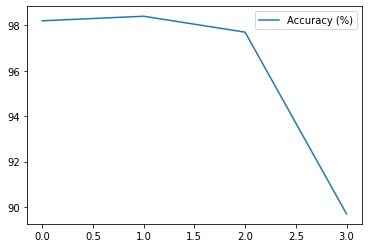

In [47]:
z.plot()